# Análisis de contenido político en medios de comunicación en México mediante técnicas de NLP

El propósito de este trabajo es realizar un análisis sobre el contenido de medios de comunicación en México aplicando distintas técnicas de aprendizaje de máquina que nos permitan dar una buena aproximación al problema de detectar el sesgo en ciertos medios. En la primera parte explicaremos la forma en que abordaremos el problema, introduciremos a la base de datos y explicaremos el pipeline de pre-procesamiento que tuvimos que seguir mediante técnicas de procesamiento de lenguaje natural, después haremos un primer ejercicio de clustering no supervisado.

In [1]:
%matplotlib inline
# pandas for data manipulation
import pandas as pd
pd.options.mode.chained_assignment = None
# nltk for nlp
from nltk.tokenize import word_tokenize, sent_tokenize
import numpy as np
from collections import Counter
import re


Para recolectar las noticias que usamos para este reporte, creamos un script en Python que se ejecuta automáticamente todos los días a las 10:30 a.m. desde el día 14 de Octubre del 2017  y juntamos encabezados hasta el día 12 de Diciembre del 2017. En este periodo de tiempo, se juntaron 19405 noticias con las características especificadas, para las palabras clave y las fuentes (por separado) siguientes:

Fuente:
- PRI
- PAN
- PRD
- MORENA
- MARGARITA
- ZAVALA
- AMLO
- ANDRES MANUEL
- LOPEZ OBRADOR
- OSORIO CHONG
- MARICHUY
- JAIME RODRIGUEZ
- RODRIGUEZ CALDERON
- EL BRONCO
- MEADE
- NARRO
- ERUVIEL
- ANAYA
- EPN
- ENRIQUE PENA NIETO
- MIGUEL ANGEL MANCERA
- MANCERA

Medios:
- www.eluniversal.com.mx
- www.proceso.com.mx
- www.excelsior.com.mx
- www.informador.com.mx
- www.reforma.com
- www.animalpolitico.com
- www.sinembargo.mx
- www.milenio.com
- www.elnorte.com
- www.sdpnoticias.com



In [2]:
#import nltk
#nltk.download('punkt')

Previo a este análisis realizamos el proceso de limpieza de los datos usando un pipeline definido en R que hace:

1- Elimina duplicados

2- Elimina puntuación

3- Convierte a minusculas

4- Elimina "stopwords"

5- Mapea ciertas palabras a una raíz definida


In [3]:
data = pd.read_csv('newsdb_fp_15jun.csv')

data.head(10)

,Unnamed: 0,fecha,encabezado,fuente,link,incompleta,enc_prep
0,1,2018-03-31,"app mexicana y el pri, niegan tener relación c...",Huffington Post,https://www.huffingtonpost.com.mx/2018/03/31/a...,True,app mexicano pri negar tener relación cambridge
1,2,2018-04-01,seré una opción para los que ya no quieren al ...,El Universal,http://www.eluniversal.com.mx/estados/sere-una...,True,opción querer pri pan
2,3,2018-04-01,amlo y anaya: colonias del viejo pri,Milenio,http://www.milenio.com/firmas/ricardo_aleman/a...,False,amlo anaya colonia viejo pri
3,4,2018-03-30,¿el pri designó a cuauhtémoc gutiérrez como ca...,Huffington Post,https://www.huffingtonpost.com.mx/2018/03/30/e...,False,pri designar cuauhtémoc gutiérrez candidato di...
4,5,2018-03-30,analistas de goldman sachs vislumbran debacle ...,Proceso,https://www.proceso.com.mx/527867/analistas-de...,True,analista goldman sachs vislumbrar debacle pri
5,6,2018-03-29,más de lo mismo: apareció el pri,Milenio,http://www.milenio.com/firmas/fernando_mejia_b...,False,mismo aparecer pri
6,7,2018-04-01,seis exfuncionarios cercanos a javier duarte b...,Animal Político,https://www.animalpolitico.com/2018/04/seis-ex...,True,seis exfuncionarios cercano javier duarte busc...
7,8,2018-03-28,"en el pri, una lista de fichas negras",Proceso,https://www.proceso.com.mx/527685/en-el-pri-un...,False,pri listar ficha negro
8,9,2018-03-20,pri: las listas del agravio,El Universal,http://www.eluniversal.com.mx/columna/salvador...,False,pri lista agraviar
9,10,2018-03-16,el pri se dice indignado por la corrupción… ajena,El Universal,http://www.eluniversal.com.mx/columna/elisa-al...,False,pri decir indignar corrupción ajeno


In [4]:
import datetime as dt

data['fecha'] = data['fecha'].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d').to_pydatetime().date())

In [5]:
#week_ago = dt.date.today() + dt.timedelta(days=-37)

#data = data[data.fecha >= week_ago]
#print('data shape:', data.shape)
#data = data.reset_index(drop=True)

In [7]:
inicio_camp = dt.date(2018,3,30)

valid_dates = [date >= inicio_camp for date in data.fecha]
data = data[valid_dates]
data = data.reset_index(drop=True)
#print('data shape:', data.shape)

Veamos el tamaño de la base:

In [8]:
print('data shape:', data.shape)

('data shape:', (26068, 7))


Veamos la distribución de los medios:

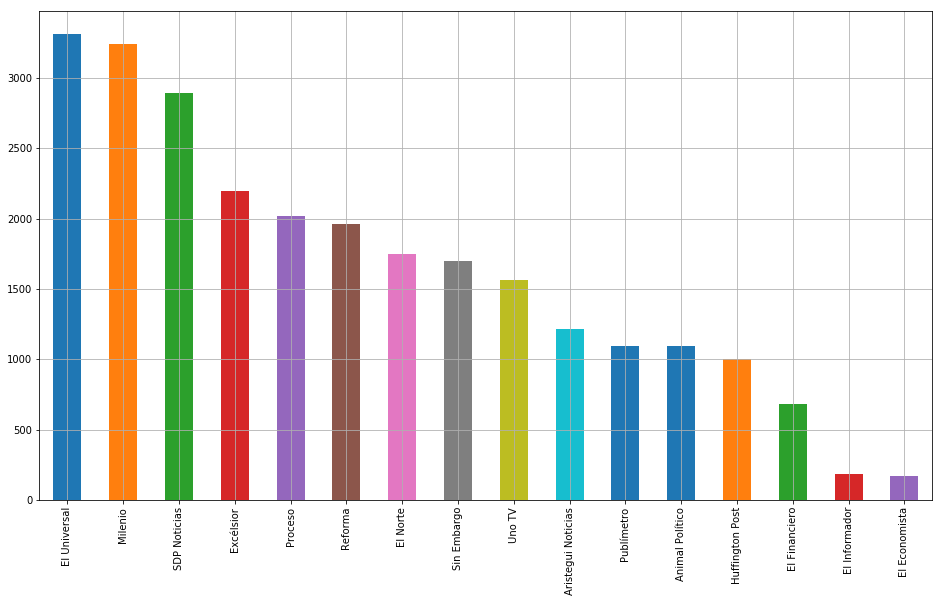

In [9]:
data.fuente.value_counts().plot(kind='bar', grid=True, figsize=(16, 9))

Para proceder, vamos a hacer clustering no supervisado con KMeans, como definimos nuestro problema en términos de agrupar las fuentes en las tres posturas ideológicas (izquierda, centro y derecha) vamos a probar con tres niveles de $k$ el número de clusters, $k=10$ es interesante por que nuestra base consta de 10 fuentes distintas, $k=3$ nos interesa porque queremos ver si es posible encontrar clusters que engloban las tres posturas y por último $k=20$ para tener una clasificación que depende menos del ruido en los datos y genera clusters más homogéneos entre si.

Ahora, la forma en la que vamos a introducir los datos al clasificador es mediante la matriz de tf-idf (term frequency - inverse document frequency) que representa la frecuencia relativa de cada palabra en un documento y en el corpus entero, para esto necesitamos tokenizar los encabezados (verlos como la lista de las palabras que les conforman) y después calcular la matriz td-idf


Para nuestro análisis nos vamos a concentrar en el nivel semántico del lenguaje, esto es, nos interesan la presencia de ciertas palabras y ciertos grupos de palabras en los documentos (o encabezados) en un sentido frecuentista e ignoramos las relaciones gramaticales entre las mismas, tomamos este supuesto en base a que el lenguaje en cada encabezado debe ser concreto y directo para atraer la atención del lector, entonces creemos que la semántica juega un papel más importante.

Nota: Para continuar consideremos las noticias publicadas en los últimos 7 días

## TF-IDF

Tomemos como corpus al conjunto de todos los términos (o palabras) en los documentos (o encabezados) que estamos analizando y a cada encabezado como un documento independiente, la matriz de tf-idf es una técnica de procesamiento de lenguaje natural que hace uso de la frecuencia relativa de cada término con respecto de cada documento y con respecto del corpus.

Para cada término en un documento calculamos su tfidf como sigue: $tf\_idf_t=tf \cdot log_{10}\frac{N}{df}$

Donde:

- $tf$: Frecuencia del término en el corpus
- $N$: Número de documentos en el conjunto de datos
- $df$: Número de documentos que contienen el término

Primero vamos a tokenizar los encabezados, para esto generamos una lista con las palabras de cada documento de la siguiente manera: 

In [10]:
def tokenizer(text):
    try:
        tokens_ = str(text).split()
        #import pdb;pdb.set_trace()
        return tokens_    
    except :
        print("Error")
        
def tokenizer(text):
    return text.split(' ')

In [11]:
data = data[pd.notnull(data['enc_prep'])]

data['tokens'] = data['enc_prep'].map(tokenizer)

In [12]:
data.head(10)

,Unnamed: 0,fecha,encabezado,fuente,link,incompleta,enc_prep,tokens
0,1,2018-03-31,"app mexicana y el pri, niegan tener relación c...",Huffington Post,https://www.huffingtonpost.com.mx/2018/03/31/a...,True,app mexicano pri negar tener relación cambridge,"[app, mexicano, pri, negar, tener, relación, c..."
1,2,2018-04-01,seré una opción para los que ya no quieren al ...,El Universal,http://www.eluniversal.com.mx/estados/sere-una...,True,opción querer pri pan,"[opción, querer, pri, pan]"
2,3,2018-04-01,amlo y anaya: colonias del viejo pri,Milenio,http://www.milenio.com/firmas/ricardo_aleman/a...,False,amlo anaya colonia viejo pri,"[amlo, anaya, colonia, viejo, pri]"
3,4,2018-03-30,¿el pri designó a cuauhtémoc gutiérrez como ca...,Huffington Post,https://www.huffingtonpost.com.mx/2018/03/30/e...,False,pri designar cuauhtémoc gutiérrez candidato di...,"[pri, designar, cuauhtémoc, gutiérrez, candida..."
4,5,2018-03-30,analistas de goldman sachs vislumbran debacle ...,Proceso,https://www.proceso.com.mx/527867/analistas-de...,True,analista goldman sachs vislumbrar debacle pri,"[analista, goldman, sachs, vislumbrar, debacle..."
5,7,2018-04-01,seis exfuncionarios cercanos a javier duarte b...,Animal Político,https://www.animalpolitico.com/2018/04/seis-ex...,True,seis exfuncionarios cercano javier duarte busc...,"[seis, exfuncionarios, cercano, javier, duarte..."
6,13,2018-04-01,meade llega a mérida para arranque de campaña,El Universal,http://www.eluniversal.com.mx/elecciones-2018/...,False,meade llegar mérida arrancar campaña,"[meade, llegar, mérida, arrancar, campaña]"
7,15,2018-04-01,ni amlo ni anaya le convienen a méxico: javier...,El Universal,http://www.eluniversal.com.mx/estados/ni-amlo-...,False,amlo anaya convenir méxico javier lozano,"[amlo, anaya, convenir, méxico, javier, lozano]"
8,17,2018-04-01,"prd ""le tomará la palabra a meade"" para elimin...",El Universal,http://www.eluniversal.com.mx/elecciones-2018/...,False,prd tomar palabra meade eliminar fuero martíne...,"[prd, tomar, palabra, meade, eliminar, fuero, ..."
9,23,2018-03-31,arranca campaña daniel verdugo; busca diputaci...,El Universal,http://www.eluniversal.com.mx/elecciones-2018/...,False,arrancar campaña daniel verdugo buscar diputac...,"[arrancar, campaña, daniel, verdugo, buscar, d..."


Filtramos encabezados que nos importan

In [109]:
import random
random.seed(420)

In [115]:
valid_heading = [('meade' in tok or 'anaya' in tok or 'amlo' in tok or 'bronco' in tok or random.random() <= .3) for tok in data.tokens]

data = data[valid_heading]
data = data.reset_index(drop=True)

In [116]:
for descripition, tokens in zip(data['enc_prep'][1:].head(5), data['tokens'][1:].head(5)):
    print('enc_prep:', descripition)
    print('tokens:', tokens)


('enc_prep:', 'seis exfuncionarios cercano javier duarte buscar votar')
('tokens:', ['seis', 'exfuncionarios', 'cercano', 'javier', 'duarte', 'buscar', 'votar'])
('enc_prep:', 'meade llegar m\xc3\xa9rida arrancar campa\xc3\xb1a')
('tokens:', ['meade', 'llegar', 'm\xc3\xa9rida', 'arrancar', 'campa\xc3\xb1a'])
('enc_prep:', 'amlo anaya convenir m\xc3\xa9xico javier lozano')
('tokens:', ['amlo', 'anaya', 'convenir', 'm\xc3\xa9xico', 'javier', 'lozano'])
('enc_prep:', 'prd tomar palabra meade eliminar fuero mart\xc3\xadnez neri')
('tokens:', ['prd', 'tomar', 'palabra', 'meade', 'eliminar', 'fuero', 'mart\xc3\xadnez', 'neri'])
('enc_prep:', 'arrancar campa\xc3\xb1a daniel verdugo buscar diputaci\xc3\xb3n federal pri')
('tokens:', ['arrancar', 'campa\xc3\xb1a', 'daniel', 'verdugo', 'buscar', 'diputaci\xc3\xb3n', 'federal', 'pri'])


Ahora vamos a calcular la frecuencia de cada término:

In [117]:
def keywords(category):
    tokens = data['tokens'][data['fuente'] == category]
    alltokens = []
    #import pdb;pdb.set_trace()
    for token_list in tokens:
        alltokens.extend(token_list)
    counter = Counter(alltokens)
    return counter.most_common(10)

In [118]:
for source in set(data['fuente']):
    print('fuente :', source)
    print('top 10 keywords:', keywords(source))
    print('---')

('fuente :', 'El Universal')
('top 10 keywords:', [('amlo', 556), ('anaya', 295), ('meade', 278), ('zavala', 96), ('candidato', 76), ('decir', 66), ('pri', 61), ('bronco', 61), ('ir', 55), ('epn', 55)])
---
('fuente :', 'El Informador')
('top 10 keywords:', [('meade', 22), ('anaya', 19), ('amlo', 16), ('zavala', 8), ('pri', 8), ('informador', 6), ('ir', 5), ('noticia', 4), ('nuevo', 4), ('voto', 4)])
---
('fuente :', 'Reforma')
('top 10 keywords:', [('amlo', 320), ('meade', 192), ('anaya', 186), ('ir', 40), ('zavala', 37), ('ofrecer', 35), ('epn', 34), ('candidato', 29), ('acusar', 25), ('debatir', 25)])
---
('fuente :', 'Animal Pol\xc3\xadtico')
('top 10 keywords:', [('amlo', 179), ('anaya', 128), ('meade', 121), ('decir', 75), ('animal', 59), ('candidato', 51), ('campa\xc3\xb1a', 42), ('pol\xc3\xadtico', 42), ('verificadomx', 39), ('zavala', 30)])
---
('fuente :', 'Huffington Post')
('top 10 keywords:', [('amlo', 225), ('anaya', 124), ('meade', 76), ('decir', 40), ('candidato', 38), 

# TF-IDF

Ahora si calculamos los valores $tf-idf$ para cada término del corpus.

In [119]:
data['flag'] = [isinstance(x, str) for x in data.enc_prep]
data = data[data.flag == True]

In [120]:
from sklearn.feature_extraction.text import TfidfVectorizer

# min_df is minimum number of documents that contain a term t
# max_features is maximum number of unique tokens (across documents) that we'd consider
# TfidfVectorizer preprocesses the descriptions using the tokenizer we defined above

vectorizer = TfidfVectorizer(min_df=10, max_features=10000, tokenizer=tokenizer, ngram_range=(1, 2),
                             decode_error = 'replace')
vz = vectorizer.fit_transform(list(data['enc_prep']))
vz.shape
pd.DataFrame(vz.todense()).head(26)


,0,1,2,3,4,5,6,7,8,9,...,1680,1681,1682,1683,1684,1685,1686,1687,1688,1689
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [121]:
tfidf = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
tfidf = pd.DataFrame(columns=['tfidf']).from_dict(dict(tfidf), orient='index')
tfidf.columns = ['tfidf']

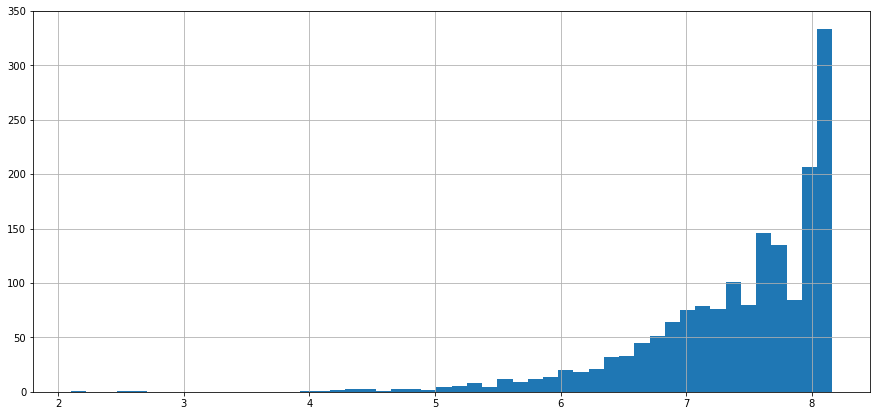

In [122]:
tfidf.tfidf.hist(bins=50, figsize=(15,7))

In [123]:
tfidf.sort_values(by=['tfidf'], ascending=True).head(10)

,tfidf
amlo,2.104762
meade,2.580269
anaya,2.624705
zavala,3.959063
candidato,4.057503
epn,4.234143
campaña,4.261344
bronco,4.287416
pri,4.314186
decir,4.335734


In [124]:
tfidf.sort_values(by=['tfidf'], ascending=False).head(10)

,tfidf
termómetroenio anaya,8.162397
anaya votar,8.162397
claudio x,8.162397
carretero,8.162397
forzar armada,8.162397
x,8.162397
tapadera,8.162397
buscar amlo,8.162397
cisneros,8.162397
candidato asesinar,8.162397


# Visualización

Para dar una visualización en dos dimensiones de una matriz de datos con tantas variables y observaciones vamos a reducir el número de variables primero utilizando la transformación por Latent Semantic Analysis (explicado a continuación) y después con Stochastic Neighbor Embedding reducimos los datos a dos dimensiones.

### Latent Semantic Analysis

Para reducir el trabajo computacional de entrenar el modelo de SNE aplicamos Latent Semantic Analysis que es una transformación similar a Principal Components Analysis que se utiliza para reducir la dimensión de la base de datos en términos de la descomposición en valores singulares (SVD).
Empleamos esta técnica porque tiene ventajas con respecto de PCA cuando la matriz de datos es rala.

### Stochastic Neighbor Embedding

El SNE es un algoritmo que mapea objetos de alta dimesionalidad en objetos de poca dimensionalidad, preservando la estructura de parentesco de una vecindad, sin importar el intercambio que resulta de una clasificación incorrecta alrededor de objetos lejanos. El SNE no tiene nada que ver con las medidas de disimilaridad pero está basado en los conceptos de entropía y divergencia probabilística.

La idea principal es centrar una distribución normal para cada valor de entrada (a lo largo del espacio de alta dimensionalidad) a fin de usar su densidad para definir una distribución de probabilidad de todos los vecinos. El objetivo es aproximar esta distribución de probabilidad tanto como sea posible replicando la estructura de parentesco en un espacio de baja dimensionalidad.

ref:(http://lijiancheng0614.github.io/scikit-learn/modules/generated/sklearn.decomposition.TruncatedSVD.html)


In [125]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=50, random_state=0)
svd_tfidf = svd.fit_transform(vz)
svd_tfidf.shape


(14189, 50)

In [126]:
pd.DataFrame(svd_tfidf).head(10)

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,0.283635,0.096687,0.162378,-0.004749,-0.082995,-0.093384,-0.058988,0.102764,0.310839,-0.078446,...,-0.106293,0.043368,-0.024554,-0.058572,0.035421,0.044840,0.159088,0.017930,0.014731,0.093788
1,0.021667,0.020414,0.003091,0.042743,0.001219,-0.029683,0.000173,-0.000997,-0.007547,0.023420,...,0.043073,0.056499,-0.064609,0.137957,0.147650,0.032505,0.036754,-0.058433,0.027088,0.034771
2,0.071078,0.151265,-0.138680,0.009049,0.000144,-0.018881,-0.051036,-0.003620,-0.021828,-0.152821,...,0.004752,0.027196,0.046275,-0.029952,0.145112,-0.034717,-0.048468,-0.031263,0.035717,-0.009159
3,0.211077,0.060110,0.130032,-0.031426,-0.006706,-0.009277,0.022641,-0.030086,-0.018968,0.061775,...,-0.077525,0.032194,-0.038950,-0.061710,0.026474,0.031996,0.115263,0.014715,0.009899,0.066018
4,0.043448,0.096106,-0.092425,-0.014869,-0.013990,-0.007697,-0.005941,0.006324,-0.004352,0.006240,...,-0.090320,0.016848,0.039230,0.061631,-0.073699,0.003434,0.016920,-0.021480,0.069645,-0.077130
5,0.042386,0.067087,-0.022537,0.107712,-0.069787,-0.128956,-0.084834,0.056593,0.227125,-0.207209,...,0.037345,0.037881,-0.104479,0.206729,0.203760,0.002236,0.097896,-0.085680,0.032521,0.030128
6,0.020170,0.017928,0.000752,0.001994,-0.018949,-0.010658,0.000257,-0.005314,-0.016088,0.014479,...,-0.087135,0.028787,0.035890,-0.040717,0.009975,-0.005875,0.059921,-0.021253,-0.042897,0.038177
7,0.315909,-0.154272,-0.014562,0.004646,0.028808,0.002943,-0.011152,0.004591,0.005115,0.012333,...,-0.066102,-0.035176,-0.199294,0.232021,0.091597,0.178645,-0.066893,0.028997,0.067328,0.097000
8,0.018827,0.026758,-0.004837,0.211939,-0.232737,-0.061702,-0.133288,-0.005793,-0.178421,0.048621,...,0.002736,-0.003433,-0.006190,-0.006187,-0.000320,0.004038,-0.002103,0.000656,-0.003952,0.000195
9,0.145140,-0.048207,-0.008568,-0.000009,0.009335,-0.010771,0.002190,-0.002360,-0.014103,-0.004946,...,-0.080570,0.082965,-0.218566,-0.015121,0.037874,-0.143542,-0.054125,0.169217,0.000688,-0.159318


In [127]:
from sklearn.decomposition import PCA
pca = TruncatedSVD(n_components=50, random_state=0)


In [128]:
%load_ext wurlitzer
import multiprocessing

multiprocessing.cpu_count()

The wurlitzer extension is already loaded. To reload it, use:
  %reload_ext wurlitzer


4

In [129]:
from MulticoreTSNE import MulticoreTSNE as TSNE

tsne_model = TSNE(n_jobs=4)
#tsne_tfidf = tsne.fit_transform(svd_tfidf)

In [130]:
#from tsne import bh_sne
#tsne_tfidf = bh_sne(svd_tfidf[1:10000])


In [131]:
#from sklearn.manifold import TSNE
#np.random.seed(420)
#tsne_model = TSNE(n_components=2, verbose=1, random_state=0)

In [132]:
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

In [133]:
tsne_tfidf.shape

(14189, 2)

In [134]:
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.plotting import figure, show, output_notebook
from bokeh.io import export_png


In [135]:
output_notebook()
plot_tfidf = bp.figure(plot_width=700, plot_height=600, title="tf-idf clustering of the news",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

Loading BokehJS ...

In [136]:
tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])
tfidf_df['encabezado'] = data['encabezado']
tfidf_df['fuente'] = data['fuente']

In [137]:
plot_tfidf.scatter(x='x', y='y', source=tfidf_df)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"encabezado": "@encabezado", "fuente":"@fuente"}
show(plot_tfidf)

# Clustering

## k means

In [138]:
vz.shape

(14189, 1690)

In [139]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

from sklearn.cluster import MiniBatchKMeans

np.random.seed(420)

num_clusters = 3
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters, init='random', n_init=1, 
                         init_size=1000, batch_size=1000, verbose=False, max_iter=10000)
kmeans = kmeans_model.fit(vz)
kmeans_clusters3 = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)

In [140]:
for (i, desc),category in zip(enumerate(data.encabezado),data['fuente']):
    if(i < 5):
        print("Cluster " + str(kmeans_clusters3[i]) + ": " + desc + 
              "(distance: " + str(kmeans_distances[i][kmeans_clusters3[i]]) + ")")
        print('fuente: ',category)
        print('---')

Cluster 0: amlo y anaya: colonias del viejo pri(distance: 0.9763446348682426)
('fuente: ', 'Milenio')
---
Cluster 0: seis exfuncionarios cercanos a javier duarte buscan el voto en ...(distance: 1.0003050876748827)
('fuente: ', 'Animal Pol\xc3\xadtico')
---
Cluster 0: meade llega a mérida para arranque de campaña(distance: 0.9915543783940067)
('fuente: ', 'El Universal')
---
Cluster 0: ni amlo ni anaya le convienen a méxico: javier lozano(distance: 0.9837790111174118)
('fuente: ', 'El Universal')
---
Cluster 0: prd "le tomará la palabra a meade" para eliminar fuero: martínez neri(distance: 0.9967383595922618)
('fuente: ', 'El Universal')
---


Descripción de las componentes del cluster

Cluster 0:
amlo | meade | anaya | candidato | epn | bronco | pri | campaña | debatir | morena | 
()
Cluster 1:
zavala | anaya | meade | anaya zavala | amlo | meade zavala | bronco | campaña | ine | votar | 
()
Cluster 2:
decir | amlo | decir amlo | amlo decir | meade | anaya | decir meade | anaya decir | meade decir | decir anaya | 
()


<Figure size 432x288 with 0 Axes>

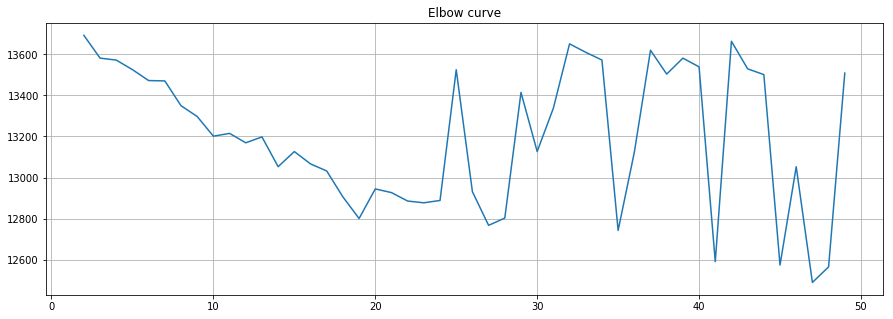

In [141]:

sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(num_clusters):
    print("Cluster %d:" % i)
    aux = ''
    for j in sorted_centroids[i, :10]:
        aux += terms[j] + ' | '
    print(aux)
    print() 
    
from matplotlib import pyplot as plt

distorsions = []
for k in range(2, 50):
    kmeans = MiniBatchKMeans(n_clusters=k)
    kmeans.fit(vz)
    distorsions.append(kmeans.inertia_)

plt.gcf().clear()
fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 50), distorsions)
plt.grid(True)
plt.title('Elbow curve')
plt.show()

In [142]:
np.random.seed(430)
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)

In [143]:
import numpy as np

colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c", "#c84dc9", "#68af4e", "#6e6cd5",
"#e3be38", "#4e2d7c", "#5fdfa8", "#d34690", "#3f6d31", "#d44427", "#7fcdd8", "#cb4053", "#5e9981",
"#803a62", "#9b9e39", "#c88cca", "#e1c37b", "#34223b", "#bdd8a3", "#6e3326", "#cfbdce", "#d07d3c",
"#52697d", "#7d6d33", "#d27c88", "#36422b", "#b68f79"])

plot_kmeans = bp.figure(plot_width=700, plot_height=600, title="KMeans clustering - k=3",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave,box_select",
    x_axis_type=None, y_axis_type=None, min_border=1)

In [144]:
kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters3
kmeans_df['encabezado'] = data['encabezado']
kmeans_df['enc_prep'] = data['enc_prep']

kmeans_df['fuente'] = data['fuente']
kmeans_df['color'] = colormap[kmeans_clusters3].tolist()

In [162]:
kmeans_df.to_csv("clusters.csv")

In [147]:
plot_kmeans.scatter(x='x', y='y',source=kmeans_df,fill_color = 'color',line_color='gray')
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"encabezado": "@encabezado", "procesado": "@enc_prep","fuente": "@fuente", "cluster":"@cluster"}
plot_kmeans.background_fill_color=None
plot_kmeans.border_fill_color=None
show(plot_kmeans)

Número de clusters = 10,20

In [146]:
np.random.seed(423)
num_clusters = 15
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters, init='k-means++', n_init=5, 
                         init_size=1000, batch_size=1000, verbose=False, max_iter=10000)
kmeans = kmeans_model.fit(vz)
kmeans_clusters10 = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)
plot_kmeans = bp.figure(plot_width=700, plot_height=600, title="KMeans clustering - k=15",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)
kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters10
kmeans_df['encabezado'] = data['encabezado']
kmeans_df['fuente'] = data['fuente']
kmeans_df['enc_prep'] = data['enc_prep']
kmeans_df['color'] = colormap[kmeans_clusters10].tolist()
plot_kmeans.scatter(x='x', y='y', 
                    source=kmeans_df,fill_color = 'color')
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"encabezado": "@encabezado","procesado": "@enc_prep", "fuente": "@fuente", "cluster":"@cluster"}
show(plot_kmeans)

In [95]:
sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(num_clusters):
    print("Cluster %d:" % i)
    aux = ''
    for j in sorted_centroids[i, :10]:
        aux += terms[j] + ' | '
    print(aux)
    print() 
    

Cluster 0:
anaya | morena | ir | barrales | bronco | campaña | ine | electoral | cdmx | sheinbaum | 
()
Cluster 1:
debatir | debatir presidencial | presidencial | candidato | debatir candidato | anaya | candidato debatir | amlo | asir | último debatir | 
()
Cluster 2:
amlo | anaya | empresario | decir | ganar | ir | si | ventaja | video | poder | 
()
Cluster 3:
meade | amlo | anaya | nestora | anaya meade | campaña | prometer | ir | meade amlo | amlo meade | 
()
Cluster 4:
pri | campaña | meade | nestora | juárez | anaya | amlo | rené juárez | rené | pri morelos | 
()
Cluster 5:
méxico | josé | antonio | josé antonio | antonio meade | meade | amlo | trump | eu | presidente | 
()
Cluster 6:
zavala | anaya | meade | amlo | meade zavala | renunciar | ine | campaña | anaya zavala | renunciar zavala | 
()
Cluster 7:
proponer | proponer amlo | anaya | zavala | candidato | amlo | proponer anaya | meade | proponer candidato | meade proponer | 
()
Cluster 8:
epn | trump | méxico | anaya | eu | 

In [ ]:
np.random.seed(430)
num_clusters = 20
kmeans_model = MiniBatchKMeans(n_clusters=20, init='k-means++', n_init=10, 
                         init_size=1000, batch_size=1000, verbose=False, max_iter=10000)
kmeans = kmeans_model.fit(vz)
kmeans_clusters20 = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)
plot_kmeans = bp.figure(plot_width=700, plot_height=600, title="KMeans clustering - k=20",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)
kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters20
kmeans_df['encabezado'] = data['encabezado']
kmeans_df['fuente'] = data['fuente']
kmeans_df['enc_prep'] = data['enc_prep']
kmeans_df['color'] = colormap[kmeans_clusters20].tolist()
plot_kmeans.scatter(x='x', y='y', 
                    source=kmeans_df,fill_color = 'color')
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"encabezado": "@encabezado","procesado": "@enc_prep", "fuente": "@fuente", "cluster":"@cluster"}
show(plot_kmeans)

SNE no es la única alternativa a la reducción de dimensión que necesitamos para generar una visualización en dos dimensiones del espacio de encabezados, en general es muy costosa, ahora veamos el resultado con el algoritmo TruncatedSVD

In [80]:
# Intento con SVD(2 componentes) en lugar de SNE

from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=2, random_state=0)
svd_tfidf = svd.fit_transform(vz)
svd_tfidf.shape

np.random.seed(423)
num_clusters = 15
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters, init='k-means++', n_init=1, 
                         init_size=1000, batch_size=1000, verbose=False, max_iter=10000)
kmeans = kmeans_model.fit(vz)
kmeans_clusters10 = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)

plot_kmeans = bp.figure(plot_width=700, plot_height=600, title="KMeans clustering - k=15",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)
kmeans_df = pd.DataFrame(svd_tfidf, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters10
kmeans_df['encabezado'] = data['encabezado']
kmeans_df['fuente'] = data['fuente']
kmeans_df['enc_prep'] = data['enc_prep']
kmeans_df['color'] = colormap[kmeans_clusters10].tolist()
plot_kmeans.scatter(x='x', y='y', 
                    source=kmeans_df,fill_color = 'color')
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"encabezado": "@encabezado","procesado": "@enc_prep", "fuente": "@fuente", "cluster":"@cluster"}
show(plot_kmeans)

# Topic Modeling con LDA

In [149]:
import lda
from sklearn.feature_extraction.text import CountVectorizer
import logging
logging.getLogger("lda").setLevel(logging.WARNING)

In [152]:
cvectorizer = CountVectorizer(min_df=4, max_features=10000, tokenizer=tokenizer, ngram_range=(1,2))
cvz = cvectorizer.fit_transform(data['enc_prep'])

n_topics = 20
n_iter = 2000
lda_model = lda.LDA(n_topics=n_topics, n_iter=n_iter)
X_topics = lda_model.fit_transform(cvz)


In [159]:
n_top_words = 8
topic_summaries = []

topic_word = lda_model.topic_word_  # get the topic words
vocab = cvectorizer.get_feature_names()
for i, topic_dist in enumerate(topic_word):
    #import pdb;pdb.set_trace()
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print(' '.join([word.encode('utf8') for word in topic_words]))

anaya amlo epn méxico político rechazar eu plantear
meade ofrecer proponer red ley faia niño guerra
meade nestora amlo respal anaya salgar nestora salgar deman
anaya amlo video mitin atacar lavar investigar llamada
meade presentar pri anaya de política juárez querer
amlo reformar meade ir educativo cnte reformar educativo anaya
meade spot amlo josé antonio bajar antonio meade josé antonio
prometer anaya gobernar barrales meade seguridad mikel cdmx
meade zavala apoyar bronco invitar anaya apoyar amlo renunciar
amlo empresario querer naim poder nuevo aeropuerto diálogo
anaya meade zavala amlo proponer bronco amlo anaya anaya meade
debatir amlo presidencial anaya debate candidato debatir presidencial llegar
amlo epn trump méxico responder exigir respetar presidente
decir amlo meade anaya ir voto retar decir amlo
amlo ganar anaya meade asegurar si encuestar elección
acusar pan morena amlo anaya denunciar pri prd
amlo votar anaya epn llamar si afirmar mexicano
candidato morena bronco pri tr

In [160]:
cvectorizer = CountVectorizer(min_df=4, max_features=10000, tokenizer=tokenizer, ngram_range=(1,2))
include_amlo = ['amlo' in token for token in data.tokens]
cvz = cvectorizer.fit_transform(data['enc_prep'][include_amlo])

n_topics = 20
n_iter = 2000
lda_model = lda.LDA(n_topics=n_topics, n_iter=n_iter)
X_topics = lda_model.fit_transform(cvz)

n_top_words = 8
topic_summaries = []

topic_word = lda_model.topic_word_  # get the topic words
vocab = cvectorizer.get_feature_names()
for i, topic_dist in enumerate(topic_word):
    #import pdb;pdb.set_trace()
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print(' '.join([word.encode('utf8') for word in topic_words]))

amlo empresario querer responder ip amlo querer amlo empresario trump
amlo anaya meade según seguir encuestar subir guerra
amlo ir campaña político cerrar amlo ir ir amlo azteca
decir amlo decir amlo amlo decir anaya empresarios iar quién
amlo apoyar campaña apoyar amlo campaña amlo ex re sumar
amlo pri spot ine morena nuevo miedo llamada
amlo debatir méxico presidente presidencial deber atacar educación
anaya meade amlo amlo anaya amlo meade anaya meade bronco debatir
ganar amlo si reformar ganar amlo educativo si ganar reformar educativo
amlo prometer voto gobernar amlo prometer prometer amlo cdmx girar
amlo anaya video debate mitin mitin amlo morena debate amlo
amlo meade nestora criticar cnte clouthier candidatura meade amlo
amlo ventaja encuestar punto llegar poder encuesta presumir
amlo epn trump usar esposar triunfar presentar esposar amlo
amlo proponer lanzar proponer amlo plan acusar acusar amlo económico
amlo ofrecer corrupción poder fox amlo ofrecer mafia ofrecer amlo
amlo c

In [ ]:
lda_df = data

doc_topic = lda_model.doc_topic_
lda_keys = []
for i, tweet in enumerate(data['encabezado']):
    lda_keys += [doc_topic[i].argmax()]
    
lda_df['topic'] = lda_keys
lda_df['topic'] = lda_df['topic'].map(int)

lda_df['len_docs'] = data['tokens'].map(len)

In [ ]:
def prepareLDAData():
    data = {
        'vocab': vocab,
        'doc_topic_dists': lda_model.doc_topic_,
        'doc_lengths': list(lda_df['len_docs']),
        'term_frequency':cvectorizer.vocabulary_,
        'topic_term_dists': lda_model.components_
    } 
    return data

In [ ]:
ldadata = prepareLDAData()
import pyLDAvis
pyLDAvis.enable_notebook()
prepared_data = pyLDAvis.prepare(**ldadata)
pyLDAvis.save_html(prepared_data,'./lda_richit.html')

# Conclusiones

Dados los resultados, podemos ver que tf-idf es una buena técnica para hacer clustering de
encabezados pues combinándola con LSE y K-Means pudimos ver que se agrupan bien los temas
en los clusters identificados, con mejores resultados cuando aumentábamos el úmero de clusters,
lo cual hace sentido ya que hay muchos temas y eventos que se cubren en las noticias diariamente,
por lo que un número óptimo de clusters podría ser el número de temas y eventos que uno estime
que han ocurrido en el periodo de tiempo transcurrido el lapso de tiempo, para el caso de las
noticias.

# Referencias


[1] Lexiconista Lemmatization Lists http://www.lexiconista.com/datasets/lemmatization/,
consultado el 13 de diciembre de 2017.

[2] Stanford NLP Term frequency and weighting https://nlp.stanford.edu/IR-book/html/
htmledition/term-frequency-and-weighting-1.html, consultado el 13 de diciembre de
2017.

[3] Scikit Learn Working With Text Data http://scikit-learn.org/stable/tutorial/text_
analytics/working_with_text_data.html#tokenizing-text-with-scikit-learn, consultado
el 13 de diciembre de 2017.

[4] Sholar, M., Glaser N. Predicting Media Bias in Online News. Stanford, 2016.

[5] Alexa Medios mas visitados en M´exico https://www.alexa.com/topsites/category/World/
Espa%C3%B1ol/Regional/Am%C3%A9rica/M%C3%A9xico/Noticias_y_medios, consultado el 13
de diciembre de 2017.

[6] Ali, O., Flaounas,I. Automating News Content Analysis: An Application to Gender Bias and
Readability. In JMLR: Workshop and Conference Proceedings 11, pp. 36-43.

[7] Mladenic, Dunja. Learning How to Detect News Bias. http://kt.ijs.si/
markodebeljak/Lectures/Seminar_MPS/2012_on/Seminars_2014_15/Jenya%20Belyaeva/
seminarIBelyaeva.pdf, consultado el 13 de diciembre de 2017.